In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
# sys.path.insert(0, '/Users/msiebert/Documents/UCSC/Research/nebular_fitting')
# os.chdir('/Users/msiebert/Documents/UCSC/Research/nebular_fitting')

In [3]:
import numpy as np
import scipy.optimize as opt
import matplotlib.pyplot as plt
import line_fitting_tools as tools
import pickle
from uncertainties import ufloat
from uncertainties.umath import *  # sin(), etc.

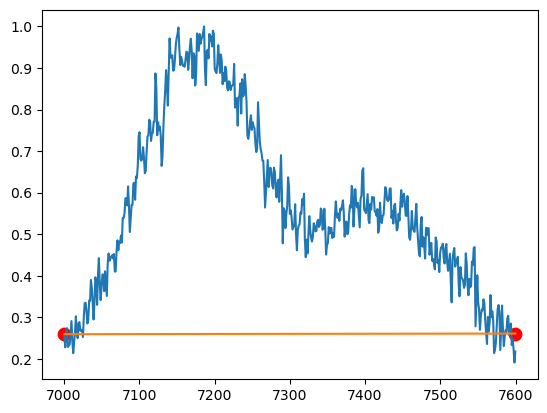

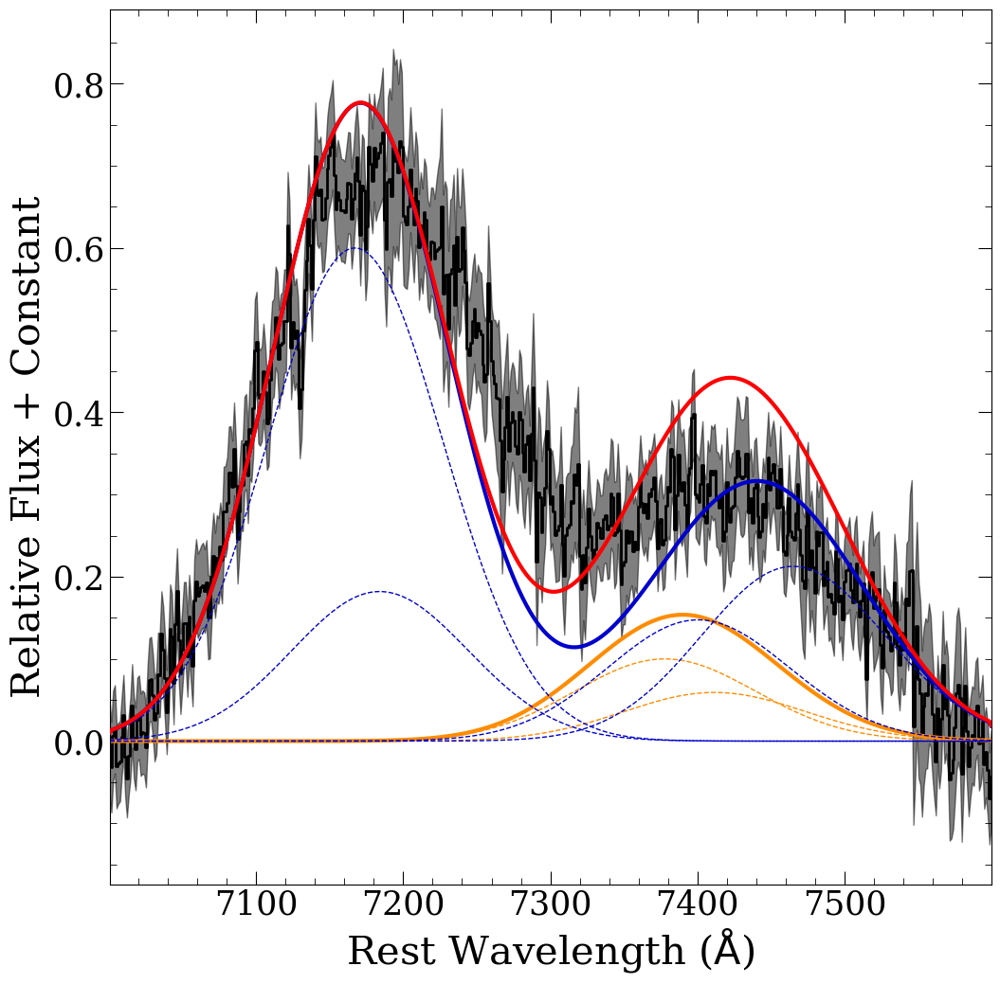

In [4]:
fit_param_indices = {}
fit_lines = []
fit_params = []

FeII_param_guess = {'amp': 0.6, 'vel': 500, 'width': 2500}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Fe II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = FeII_param_guess)

NiII_param_guess = {'amp': 0.1, 'vel': 0, 'width': 2500} 
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ni II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = NiII_param_guess)

#CaII_param_guess = {'amp': 0.11, 'vel': -1500, 'width': 35.}
#fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_c', fit_lines, fit_params, fit_param_indices, 
#                                                          components='all', param_guess = CaII_param_guess)

# for line in fit_lines:
#     print (line.name, line.rest_wave)
# print (fit_params)
# print (fit_param_indices)
tools.set_all_line_params(fit_params, fit_lines, fit_param_indices)

sn2023bee_spec = np.genfromtxt("2023bee-combined-20240214_ap1.flm", unpack=True)
z = 0.0067
sn2023bee_wave = sn2023bee_spec[0]/(1+z)
sn2023bee_flux = sn2023bee_spec[1]
sn2023bee_fluxerr = sn2023bee_spec[2]

wave_min = 7000
wave_max = 7600
buff = 0
roi = (sn2023bee_wave > wave_min-buff) & (sn2023bee_wave < wave_max+buff)
w_range = sn2023bee_wave[roi]

scale_factor = (1./np.amax(sn2023bee_flux[roi]))
flux_test = sn2023bee_flux[roi]*scale_factor
err_test = sn2023bee_fluxerr[roi]*scale_factor

sn2023bee_data = [sn2023bee_wave, sn2023bee_flux, sn2023bee_fluxerr]

fit_cont=True
custom_bnds = {}
# custom_bnds['[Ca II]_a_width'] = [150,500]
# custom_bnds['[Ca II]_b_width'] = [150,500]
if fit_cont:
    buff = 50
    fit_params.append(wave_min)
    fit_params.append(wave_max)
    custom_bnds['wave_min'] = (wave_min, wave_min+buff)
    custom_bnds['wave_max'] = (wave_max-buff, wave_max)

vel_ranges = tools.calc_vel_ranges(w_range,fit_lines)

fit_setup = fit_lines, fit_params, fit_param_indices
test = tools.multiple_gaussians(fit_lines, flux_test, w_range, fit_params, err_test, fit_cont, lsf_width=30,
                                plot=True, plot_cont=True, plot_ivar=True, store_line_fluxes = True, savename=None)

{'wave_min': (7000, 7050), 'wave_max': (7550, 7600)}
(7000, 7050)
[(0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (7000, 7050), (7550, 7600)]
Fitting...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         2 variables are exactly at the bounds

At iterate    0    f=  9.86982D+02    |proj g|=  6.00000D-01

At iterate    1    f=  8.18259D+02    |proj g|=  1.45701D+00

At iterate    2    f=  7.49786D+02    |proj g|=  1.43785D+00

At iterate    3    f=  7.43790D+02    |proj g|=  1.23744D+00

At iterate    4    f=  7.41022D+02    |proj g|=  1.94736D+00

At iterate    5    f=  7.20593D+02    |proj g|=  1.95265D+00

At iterate    6    f=  6.76973D+02    |proj g|=  1.96019D+00

At iterate    7    f=  5.91489D+02    |proj g|=  1.96966D+00

At iterate    8    f=  4.67966D+02    |proj g|=  1.97647D+00

At iterate    9    f=  3.69934D+02    |proj g|=  1.97508D+00

At iterate   1

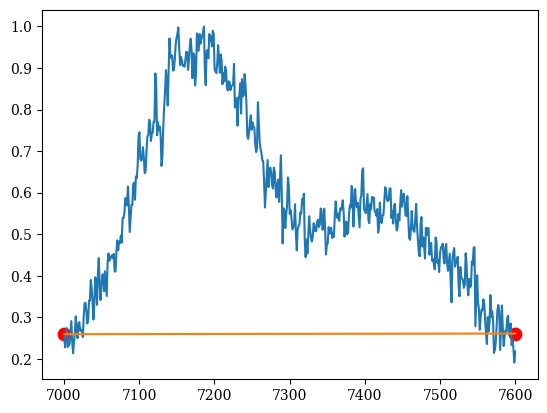

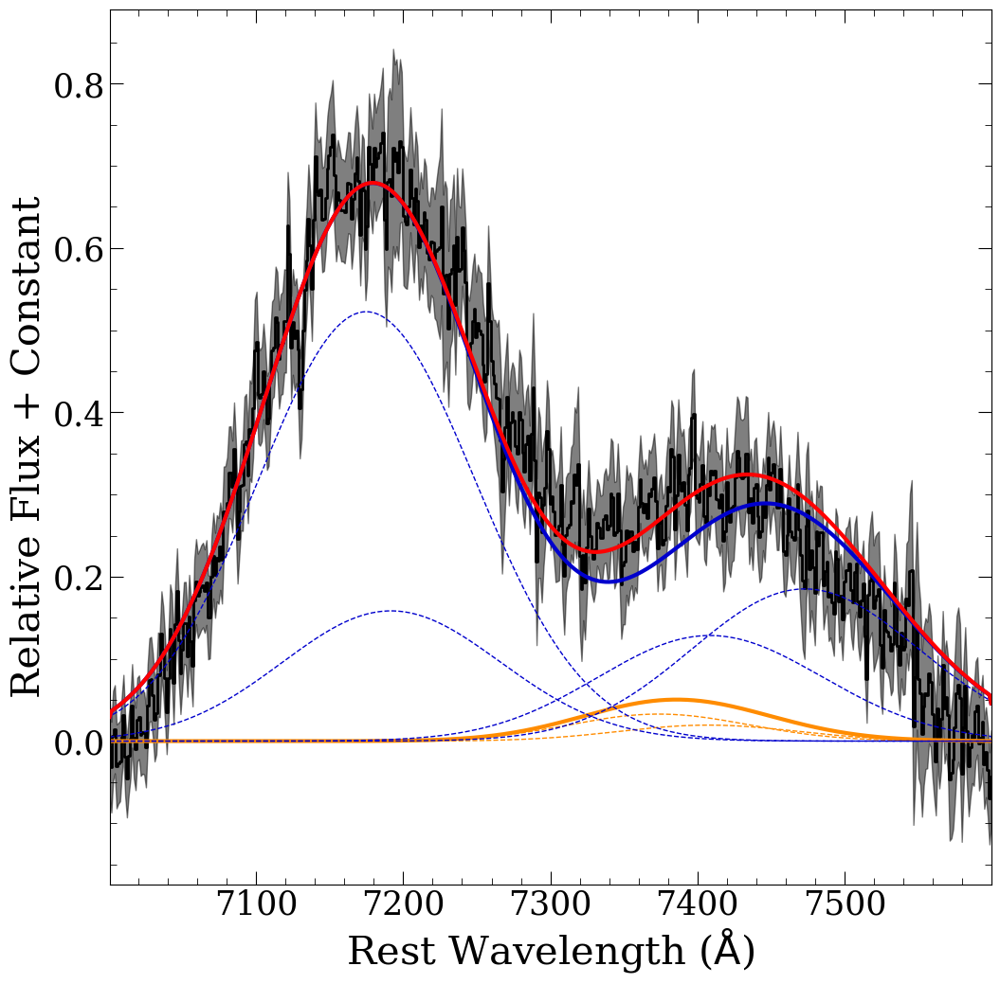

  0%|          | 0/200 [00:00<?, ?it/s]/Users/svoncoelln/anaconda3/lib/python3.10/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 1000/1000 [08:11<00:00,  2.03it/s]


In [5]:
all_fit_data = tools.fit_lines(sn2023bee_data, gal_fit=False, fit_setup = fit_setup, 
                         custom_bnds = custom_bnds, fit_cont=True, lsf_width=30,
#                          wave_range = [wave_min,wave_max], mc_params = [50, 50, 100])
                        wave_range = [wave_min,wave_max], mc_params = [50, 200, 1000])

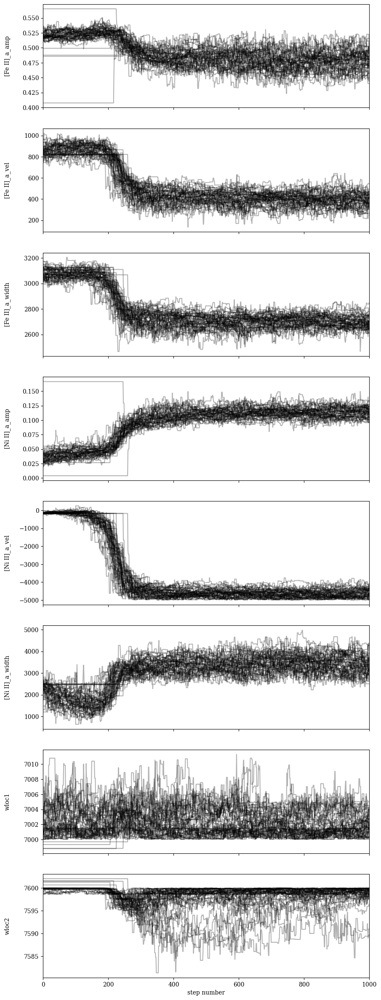

[<line_fitting_tools.element_line object at 0x7f88d98369b0>, <line_fitting_tools.element_line object at 0x7f88d9836950>, <line_fitting_tools.element_line object at 0x7f88d9836920>, <line_fitting_tools.element_line object at 0x7f88d98369e0>, <line_fitting_tools.element_line object at 0x7f88d9836a40>, <line_fitting_tools.element_line object at 0x7f88d9836980>]
[0.6, 500, 2500, 0.1, 0, 2500, 7000, 7600]
{'[Fe II]_a_amp': 0, '[Fe II]_a_vel': 1, '[Fe II]_a_width': 2, '[Ni II]_a_amp': 3, '[Ni II]_a_vel': 4, '[Ni II]_a_width': 5}


In [6]:
labels = tools.plot_chain(all_fit_data,fit_cont=True)
print(fit_lines)
print(fit_params)
print(fit_param_indices)

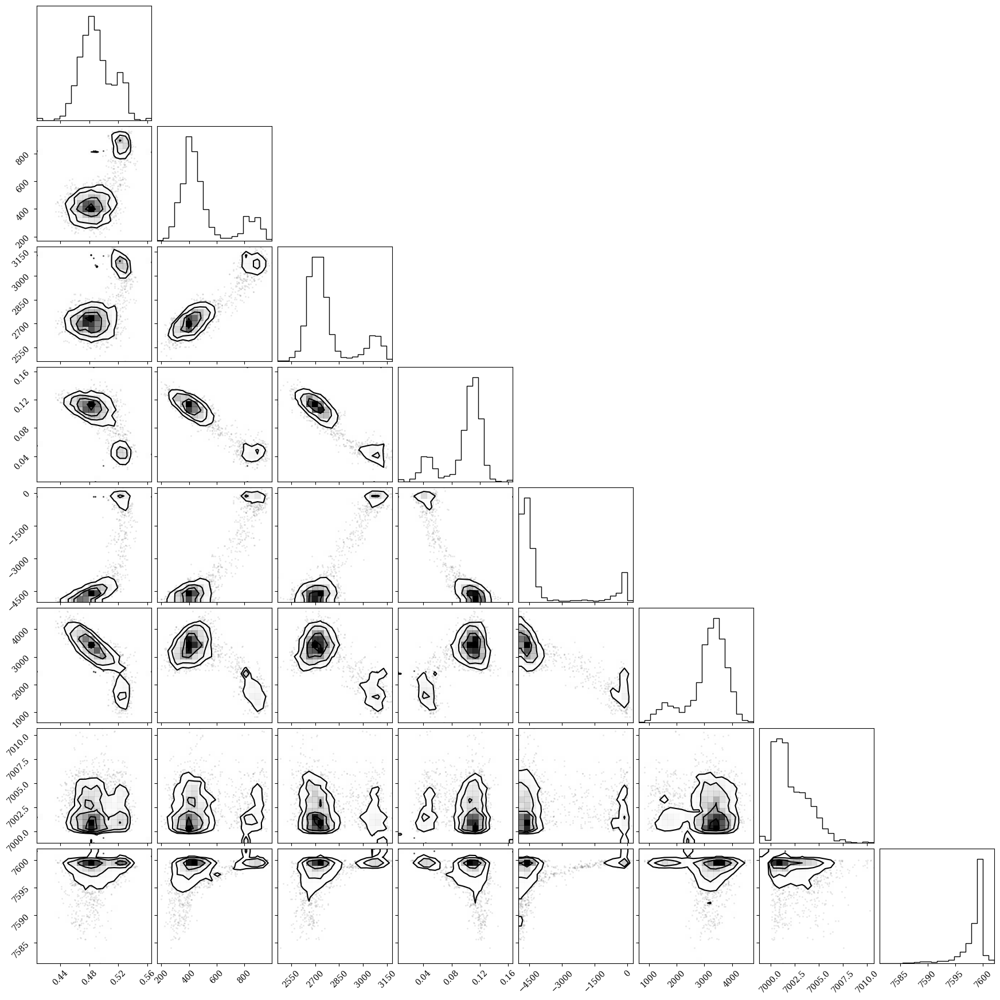

In [7]:
flat_samples = tools.get_flat_samples(all_fit_data[0], labels=None, plot=True)

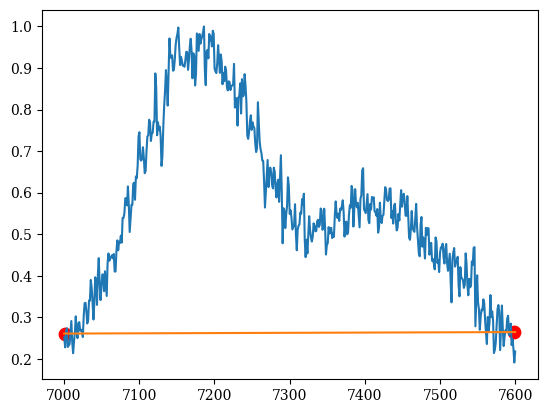

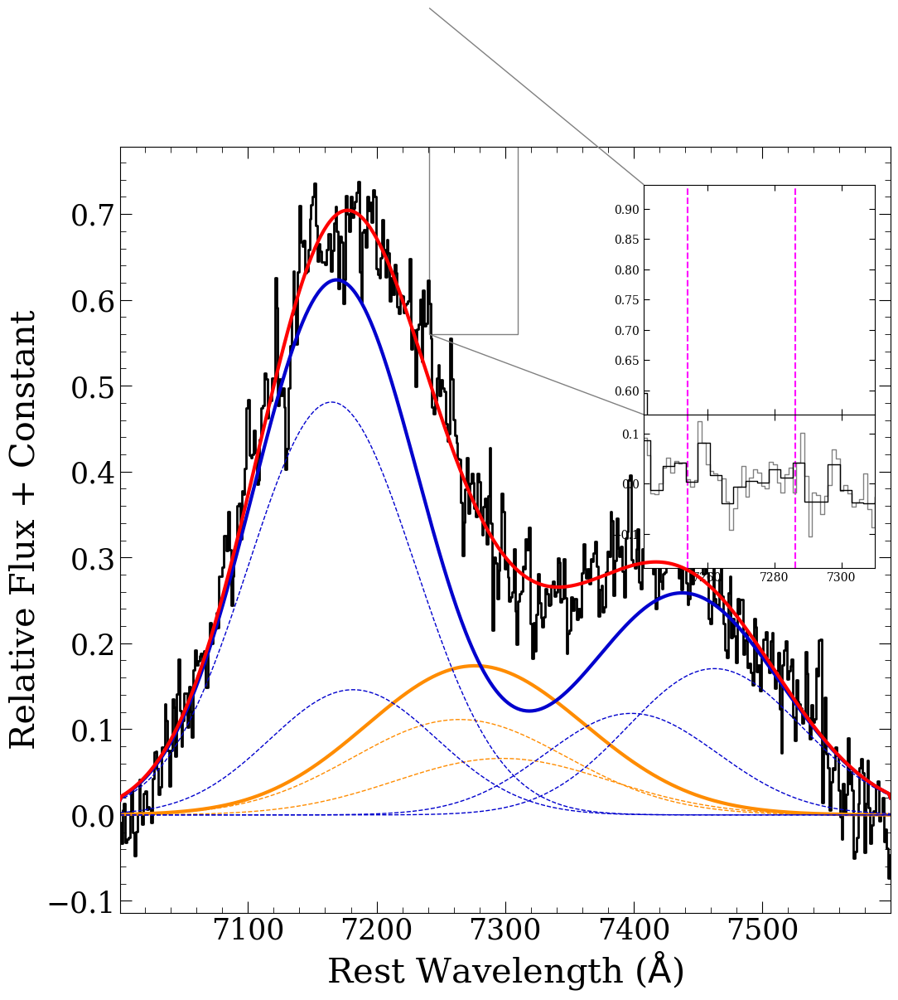

In [8]:
import line_fitting_tools as tools

sampler, mgaus_solved, fit_params_solved, fit_lines, fit_params, fit_param_indices, fit_flux_interp, wave_interp, fit_err_interp, fit_cont, scale_factor, fit_hes_matrix = all_fit_data
fit_params_solved_emcee, fit_params_errs_emcee = tools.estimate_params(all_fit_data, flat_samples, burn_in=900)
emcee_samples = tools.get_rand_samples(flat_samples,n=100)
mgaus_solved_emcee = tools.multiple_gaussians(fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, fit_err_interp, fit_cont, fit_param_indices = fit_param_indices, emcee_samples = emcee_samples, 
                                              plot=True, plot_cont=True, lsf_width=30,
                                        plot_ivar=False, plot_resid=False, plot_inset=True,store_line_fluxes = False, savename=None)

In [9]:
for i,param in enumerate(fit_param_indices.keys()):
    print (param + '\t', + np.round(fit_params_solved_emcee[fit_param_indices[param]],2), 
           np.round(fit_params_errs_emcee[fit_param_indices[param]],3))

[Fe II]_a_amp	 0.48 0.015
[Fe II]_a_vel	 409.2 66.61
[Fe II]_a_width	 2706.58 51.141
[Ni II]_a_amp	 0.11 0.01
[Ni II]_a_vel	 -4636.45 230.686
[Ni II]_a_width	 3419.23 397.039


In [26]:
SN2023bee_2comp_mostparams_emcee = [fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, 
                                    fit_params_errs_emcee, fit_err_interp, fit_cont, fit_param_indices, 
                                    emcee_samples]
pickle.dump(SN2023bee_2comp_mostparams_emcee, open('emcee_fits/SN2023bee_2component_mostparams_lsfconv.sav', 'wb'))

FileNotFoundError: [Errno 2] No such file or directory: 'emcee_fits/SN2023bee_2component_mostparams_lsfconv.sav'

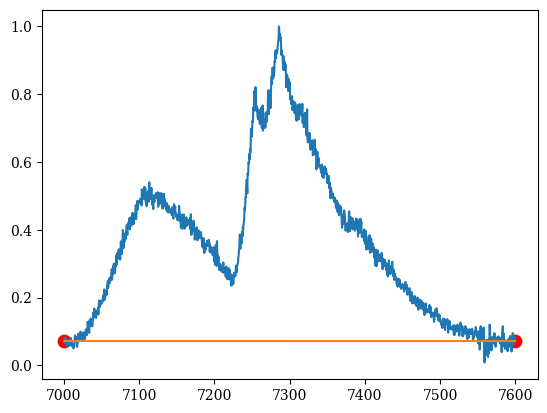

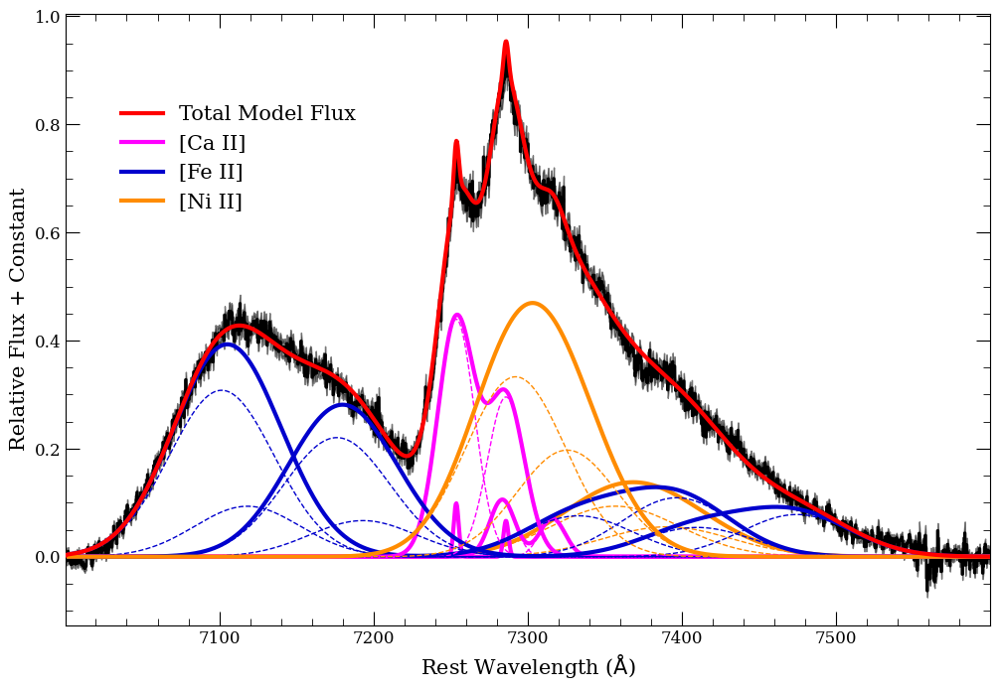

In [ ]:
fit_param_indices = {}
fit_lines = []
fit_params = []

FeII_param_guess = {'amp': fit_params_solved_emcee[0], 'vel': fit_params_solved_emcee[1], 'width': fit_params_solved_emcee[2]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Fe II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = FeII_param_guess)

FeII_param_guess = {'amp': fit_params_solved_emcee[3], 'vel': fit_params_solved_emcee[4], 'width': '[Fe II]_a'}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Fe II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = FeII_param_guess)



# NiII_param_guess = {'amp': 0.26, 'vel': -3435, 'width': 1800} 
NiII_param_guess = {'amp': fit_params_solved_emcee[5], 'vel': fit_params_solved_emcee[6], 'width': fit_params_solved_emcee[7]} 
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ni II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = NiII_param_guess)

NiII_param_guess = {'amp': fit_params_solved_emcee[8], 'vel': fit_params_solved_emcee[9], 'width': fit_params_solved_emcee[10]} 
# NiII_param_guess = {'amp': 0.08, 'vel': -920, 'width': '[Ni II]_a'} 
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ni II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = NiII_param_guess)



CaII_param_guess = {'amp': fit_params_solved_emcee[11], 'vel': fit_params_solved_emcee[12], 'width': fit_params_solved_emcee[13]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = CaII_param_guess)

CaII_param_guess = {'amp': fit_params_solved_emcee[14], 'vel': fit_params_solved_emcee[15], 'width': fit_params_solved_emcee[16]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = CaII_param_guess)

CaII_param_guess = {'amp': 0.11, 'vel': fit_params_solved_emcee[12], 'width': 60.}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_c', fit_lines, fit_params, fit_param_indices, 
                                                         components='all', param_guess = CaII_param_guess)

# for line in fit_lines:
#     print (line.name, line.rest_wave)
# print (fit_params)
# print (fit_param_indices)
tools.set_all_line_params(fit_params, fit_lines, fit_param_indices)

sn2023bee_spec = np.genfromtxt("comparison_spectra/2023bee-red-20210212_ap1.flm", unpack=True)
z = 0.005811
sn2023bee_wave = sn2023bee_spec[0]/(1+z)
sn2023bee_flux = sn2023bee_spec[1]
sn2023bee_fluxerr = sn2023bee_spec[2]

wave_min = 7000
wave_max = 7600
buff = 0
roi = (sn2023bee_wave > wave_min-buff) & (sn2023bee_wave < wave_max+buff)
w_range = sn2023bee_wave[roi]

scale_factor = (1./np.amax(sn2023bee_flux[roi]))
flux_test = sn2023bee_flux[roi]*scale_factor
err_test = sn2023bee_fluxerr[roi]*scale_factor

sn2023bee_data = [sn2023bee_wave, sn2023bee_flux, sn2023bee_fluxerr]

fit_cont=True
custom_bnds = {}
# custom_bnds = {'[Ca II]_a_width':[150,500]}
# custom_bnds['[Ca II]_b_width'] = [150,500]
custom_bnds = {'[Ca II]_c_width':[0,150]}
if fit_cont:
    buff = 50
    fit_params.append(wave_min)
    fit_params.append(wave_max)
    custom_bnds['wave_min'] = (wave_min, wave_min+buff)
    custom_bnds['wave_max'] = (wave_max-buff, wave_max)

vel_ranges = tools.calc_vel_ranges(w_range,fit_lines)

fit_setup = fit_lines, fit_params, fit_param_indices
test = tools.multiple_gaussians(fit_lines, flux_test, w_range, fit_params, err_test, fit_cont, 
                                plot=True, plot_cont=True, lsf_width=30,
                                plot_ivar=True, store_line_fluxes = True, savename=None)

{'[Ca II]_c_width': [0, 150], 'wave_min': (7000, 7050), 'wave_max': (7550, 7600)}
[(0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0, 150), (7000, 7050), (7550, 7600)]
Fitting...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           22     M =           10

At X0         2 variables are exactly at the bounds

At iterate    0    f=  2.18616D+03    |proj g|=  3.73749D+00

At iterate    1    f=  2.14441D+03    |proj g|=  2.71372D+00

At iterate    2    f=  2.11949D+03    |proj g|=  2.30315D+00

At iterate    3    f=  2.09424D+03    |proj g|=  1.91087D+00

At iterate    4    f=  2.08277D+03    |proj g|=  2.31736D+00

At iterate    5    f=  2.06838D+03    |proj g|=  2.68133D+00

At iterate    6    f=  2.06431D+03  

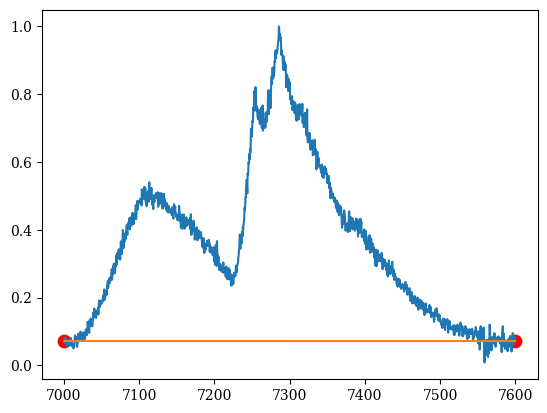

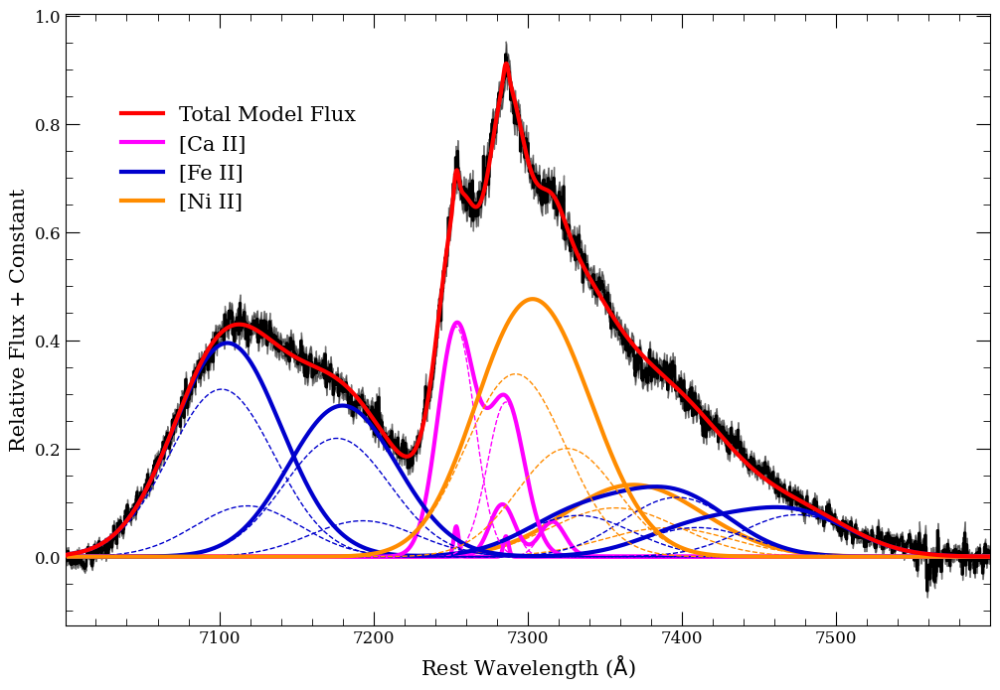

In [ ]:
all_fit_data = tools.fit_lines(sn2023bee_data, gal_fit=False, fit_setup = fit_setup, 
                         custom_bnds = custom_bnds, fit_cont=True, lsf_width=30,
#                          wave_range = [wave_min,wave_max], mc_params = [50, 50, 100])
                        wave_range = [wave_min,wave_max], mc_params = [50, 200, 1000])

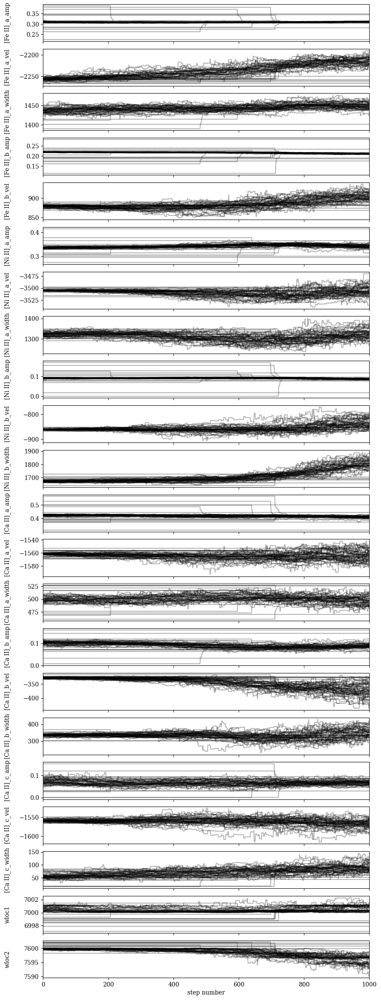

[<line_fitting_tools.element_line object at 0x1808384c0>, <line_fitting_tools.element_line object at 0x17c94fb50>, <line_fitting_tools.element_line object at 0x17c94dd80>, <line_fitting_tools.element_line object at 0x17c94f940>, <line_fitting_tools.element_line object at 0x197bccd30>, <line_fitting_tools.element_line object at 0x197bcceb0>, <line_fitting_tools.element_line object at 0x197bcf3d0>, <line_fitting_tools.element_line object at 0x197bce3e0>, <line_fitting_tools.element_line object at 0x197bce0b0>, <line_fitting_tools.element_line object at 0x197bcf490>, <line_fitting_tools.element_line object at 0x197bccee0>, <line_fitting_tools.element_line object at 0x197bcdf30>, <line_fitting_tools.element_line object at 0x197bccfa0>, <line_fitting_tools.element_line object at 0x197bccfd0>, <line_fitting_tools.element_line object at 0x197bcd000>, <line_fitting_tools.element_line object at 0x197bcd030>, <line_fitting_tools.element_line object at 0x197bcefb0>, <line_fitting_tools.element_li

In [ ]:
labels = tools.plot_chain(all_fit_data,fit_cont=True)
print(fit_lines)
print(fit_params)
print(fit_param_indices)

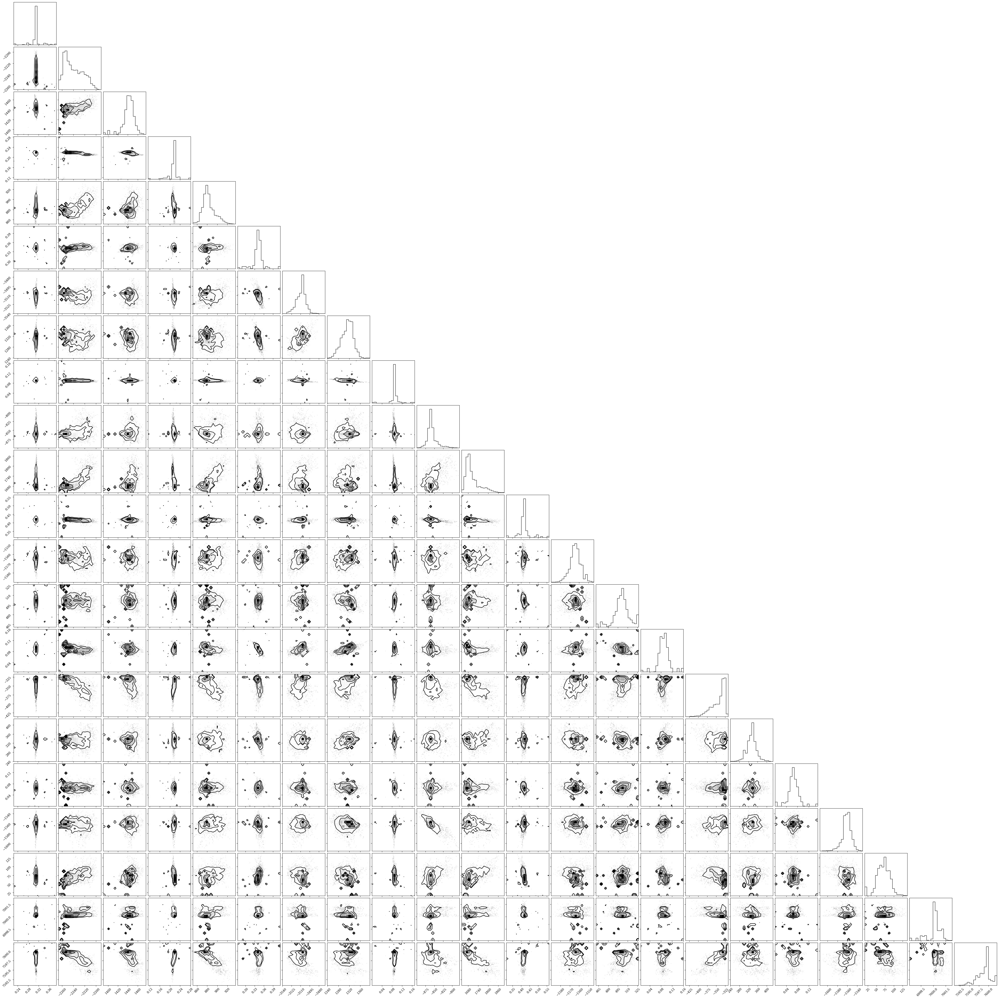

In [ ]:
flat_samples = tools.get_flat_samples(all_fit_data[0], labels=None, plot=True)

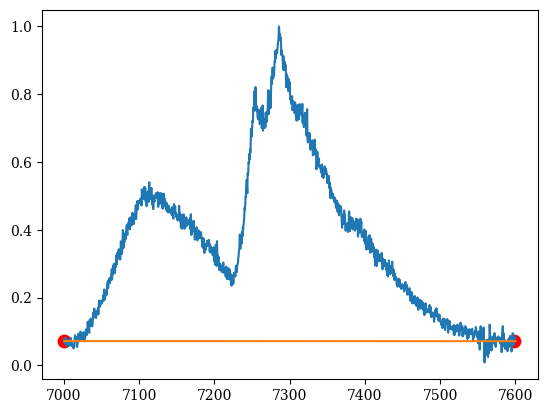

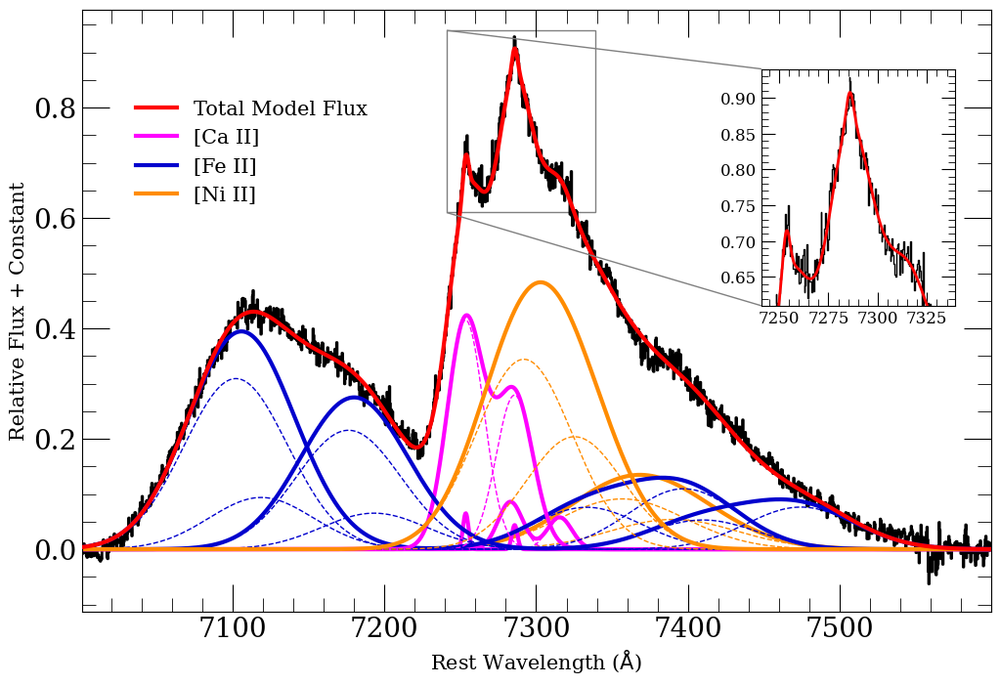

In [ ]:
import line_fitting_tools as tools

sampler, mgaus_solved, fit_params_solved, fit_lines, fit_params, fit_param_indices, fit_flux_interp, wave_interp, fit_err_interp, fit_cont, scale_factor, fit_hes_matrix = all_fit_data
fit_params_solved_emcee, fit_params_errs_emcee = tools.estimate_params(all_fit_data, flat_samples, burn_in=900)
emcee_samples = tools.get_rand_samples(flat_samples,n=100)
mgaus_solved_emcee = tools.multiple_gaussians(fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, fit_err_interp, fit_cont, fit_param_indices = fit_param_indices, emcee_samples = emcee_samples, plot=True, plot_cont=True, 
                                        plot_ivar=False, plot_resid=False, plot_inset=True, store_line_fluxes = False, savename=None)

In [ ]:
for i,param in enumerate(fit_param_indices.keys()):
    print (param + '\t', + np.round(fit_params_solved_emcee[fit_param_indices[param]],2), 
           np.round(fit_params_errs_emcee[fit_param_indices[param]],3))

[Fe II]_a_amp	 0.31 0.003
[Fe II]_a_vel	 -2234.22 18.758
[Fe II]_a_width	 1443.94 8.045
[Fe II]_b_amp	 0.22 0.004
[Fe II]_b_vel	 883.54 13.264
[Fe II]_b_width	 1443.94 8.045
[Ni II]_a_amp	 0.34 0.008
[Ni II]_a_vel	 -3510.45 7.444
[Ni II]_a_width	 1308.46 22.932
[Ni II]_b_amp	 0.09 0.004
[Ni II]_b_vel	 -859.01 13.202
[Ni II]_b_width	 1702.79 46.611
[Ca II]_a_amp	 0.42 0.009
[Ca II]_a_vel	 -1564.91 6.27
[Ca II]_a_width	 501.44 9.235
[Ca II]_b_amp	 0.09 0.012
[Ca II]_b_vel	 -346.55 20.658
[Ca II]_b_width	 332.91 23.434
[Ca II]_c_amp	 0.07 0.014
[Ca II]_c_vel	 -1561.63 9.321
[Ca II]_c_width	 75.17 17.204


In [ ]:
SN2023bee_3comp_mostparams_emcee = [fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, 
                                    fit_params_errs_emcee, fit_err_interp, fit_cont, fit_param_indices, 
                                    emcee_samples]
pickle.dump(SN2023bee_3comp_mostparams_emcee, open('emcee_fits/SN2023bee_3component_mostparams_lsfconv.sav', 'wb'))

In [ ]:
SN2023bee_3comp_mostparams_emcee = pickle.load(open('emcee_fits/SN2023bee_3component_mostparams_lsfconv.sav', 'rb'))

In [13]:
for i,param in enumerate(SN2023bee_3comp_mostparams_emcee[7].keys()):
    ufloat(float('nan'), float('nan'))
    final_val = SN2023bee_3comp_mostparams_emcee[3][SN2023bee_3comp_mostparams_emcee[7][param]]
    final_err = SN2023bee_3comp_mostparams_emcee[4][SN2023bee_3comp_mostparams_emcee[7][param]]
    final_param = ufloat(final_val,final_err)
#     print (param + '\t', + np.round(SN2023bee_1compskew_emcee[3][SN2023bee_1compskew_emcee[7][param]],2), 
#            np.round(SN2023bee_1compskew_emcee[4][SN2023bee_1compskew_emcee[7][param]],3))
    print (SN2023bee_3comp_mostparams_emcee[7][param], param + '\t', + final_param)

0 [Fe II]_a_amp	 0.3092+/-0.0025
1 [Fe II]_a_vel	 -2234+/-19
2 [Fe II]_a_width	 1444+/-8
3 [Fe II]_b_amp	 0.216+/-0.004
4 [Fe II]_b_vel	 884+/-13
2 [Fe II]_b_width	 1444+/-8
5 [Ni II]_a_amp	 0.344+/-0.008
6 [Ni II]_a_vel	 -3510+/-7
7 [Ni II]_a_width	 1308+/-23
8 [Ni II]_b_amp	 0.091+/-0.004
9 [Ni II]_b_vel	 -859+/-13
10 [Ni II]_b_width	 (1.70+/-0.05)e+03
11 [Ca II]_a_amp	 0.415+/-0.009
12 [Ca II]_a_vel	 -1565+/-6
13 [Ca II]_a_width	 501+/-9
14 [Ca II]_b_amp	 0.086+/-0.012
15 [Ca II]_b_vel	 -347+/-21
16 [Ca II]_b_width	 333+/-23
17 [Ca II]_c_amp	 0.065+/-0.014
18 [Ca II]_c_vel	 -1562+/-9
19 [Ca II]_c_width	 75+/-17


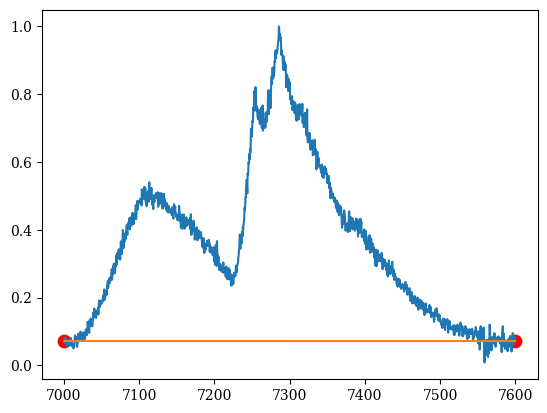

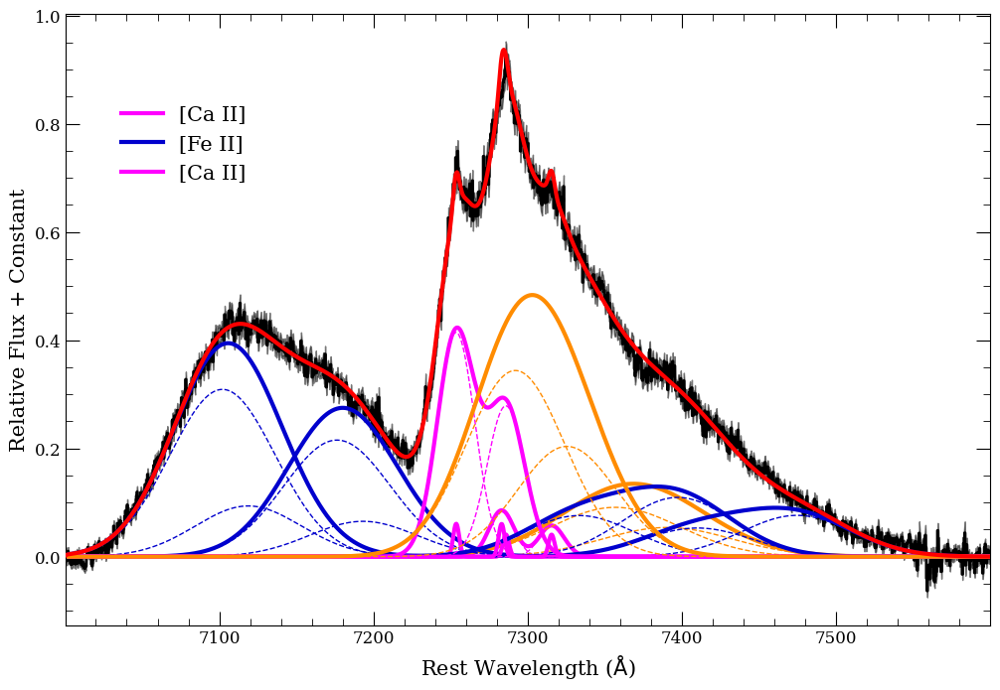

In [16]:
fit_param_indices = {}
fit_lines = []
fit_params = []

params = SN2023bee_3comp_mostparams_emcee[3]
FeII_param_guess = {'amp': params[0], 'vel': params[1], 'width': params[2]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Fe II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = FeII_param_guess)

FeII_param_guess = {'amp': params[3], 'vel': params[4], 'width': '[Fe II]_a'}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Fe II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = FeII_param_guess)



# NiII_param_guess = {'amp': 0.26, 'vel': -3435, 'width': 1800} 
NiII_param_guess = {'amp': params[5], 'vel': params[6], 'width': params[7]} 
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ni II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = NiII_param_guess)

NiII_param_guess = {'amp': params[8], 'vel': params[9], 'width': params[10]} 
# NiII_param_guess = {'amp': 0.08, 'vel': -920, 'width': '[Ni II]_a'} 
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ni II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = NiII_param_guess)



CaII_param_guess = {'amp': params[11], 'vel': params[12], 'width': params[13]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_a', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = CaII_param_guess)

CaII_param_guess = {'amp': params[14], 'vel': params[15], 'width': params[16]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_b', fit_lines, fit_params, fit_param_indices, 
                                                        components='all', param_guess = CaII_param_guess)

CaII_param_guess = {'amp': params[17], 'vel': params[18], 'width': params[19]}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_c', fit_lines, fit_params, fit_param_indices, 
                                                         components='all', param_guess = CaII_param_guess)

CaII_param_guess = {'amp': 0.065, 'vel': -347, 'width': 75}
fit_lines, fit_params, fit_param_indices = tools.add_line_to_fit('[Ca II]_d', fit_lines, fit_params, fit_param_indices, 
                                                         components='all', param_guess = CaII_param_guess)

# for line in fit_lines:
#     print (line.name, line.rest_wave)
# print (fit_params)
# print (fit_param_indices)
tools.set_all_line_params(fit_params, fit_lines, fit_param_indices)

sn2023bee_spec = np.genfromtxt("comparison_spectra/2023bee-red-20210212_ap1.flm", unpack=True)
z = 0.005811
sn2023bee_wave = sn2023bee_spec[0]/(1+z)
sn2023bee_flux = sn2023bee_spec[1]
sn2023bee_fluxerr = sn2023bee_spec[2]

wave_min = 7000
wave_max = 7600
buff = 0
roi = (sn2023bee_wave > wave_min-buff) & (sn2023bee_wave < wave_max+buff)
w_range = sn2023bee_wave[roi]

scale_factor = (1./np.amax(sn2023bee_flux[roi]))
flux_test = sn2023bee_flux[roi]*scale_factor
err_test = sn2023bee_fluxerr[roi]*scale_factor

sn2023bee_data = [sn2023bee_wave, sn2023bee_flux, sn2023bee_fluxerr]

fit_cont=True
custom_bnds = {}
# custom_bnds = {'[Ca II]_a_width':[150,500]}
# custom_bnds['[Ca II]_b_width'] = [150,500]
custom_bnds = {'[Ca II]_c_width':[0,150]}
if fit_cont:
    buff = 50
    fit_params.append(wave_min)
    fit_params.append(wave_max)
    custom_bnds['wave_min'] = (wave_min, wave_min+buff)
    custom_bnds['wave_max'] = (wave_max-buff, wave_max)

vel_ranges = tools.calc_vel_ranges(w_range,fit_lines)

fit_setup = fit_lines, fit_params, fit_param_indices
test = tools.multiple_gaussians(fit_lines, flux_test, w_range, fit_params, err_test, fit_cont, 
                                plot=True, plot_cont=True, lsf_width=30,
                                plot_ivar=True, store_line_fluxes = True, savename=None)

{'[Ca II]_c_width': [0, 150], 'wave_min': (7000, 7050), 'wave_max': (7550, 7600)}
[(0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (0.0, 2.0), (-5000.0, 5000.0), (0, 150), (0.0, 2.0), (-5000.0, 5000.0), (0.0, 5000.0), (7000, 7050), (7550, 7600)]
Fitting...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           25     M =           10

At X0         2 variables are exactly at the bounds

At iterate    0    f=  2.10061D+03    |proj g|=  1.78447D+00

At iterate    1    f=  2.09903D+03    |proj g|=  1.28079D+00

At iterate    2    f=  2.08354D+03    |proj g|=  1.91048D+00

At iterate    3    f=  2.07594D+03    |proj g|=  1.90980D+00

At iterate    4    f=  2.06447D+03    |proj g|=  1.78458D+00

At iterate    5    f=  2.05482D+03    |proj g|=  1.6

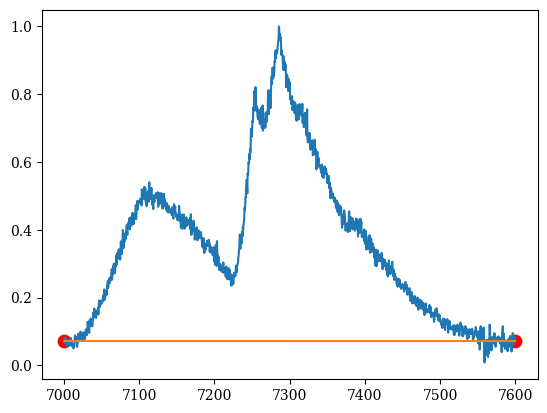

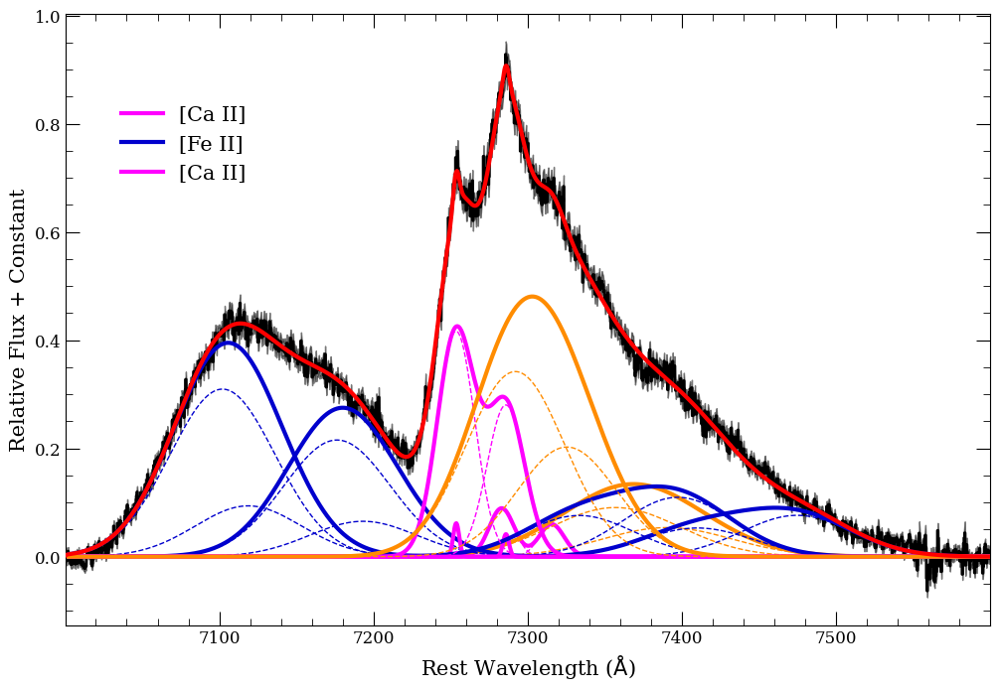

You must install the tqdm library to use progress indicators with emcee
/Users/msiebert/miniconda3/envs/python3/lib/python3.10/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
You must install the tqdm library to use progress indicators with emcee


In [17]:
all_fit_data = tools.fit_lines(sn2023bee_data, gal_fit=False, fit_setup = fit_setup, 
                         custom_bnds = custom_bnds, fit_cont=True, lsf_width=30,
#                          wave_range = [wave_min,wave_max], mc_params = [50, 50, 100])
                        wave_range = [wave_min,wave_max], mc_params = [50, 200, 1000])

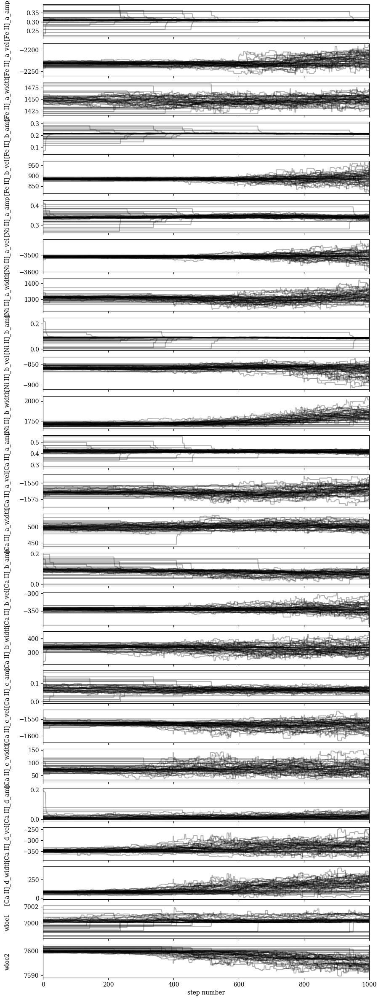

[<line_fitting_tools.element_line object at 0x180678a30>, <line_fitting_tools.element_line object at 0x1806789d0>, <line_fitting_tools.element_line object at 0x180678ac0>, <line_fitting_tools.element_line object at 0x1806789a0>, <line_fitting_tools.element_line object at 0x180678940>, <line_fitting_tools.element_line object at 0x180678a60>, <line_fitting_tools.element_line object at 0x180678910>, <line_fitting_tools.element_line object at 0x1806788e0>, <line_fitting_tools.element_line object at 0x180678880>, <line_fitting_tools.element_line object at 0x180678a00>, <line_fitting_tools.element_line object at 0x180678820>, <line_fitting_tools.element_line object at 0x180678970>, <line_fitting_tools.element_line object at 0x1806787c0>, <line_fitting_tools.element_line object at 0x1806788b0>, <line_fitting_tools.element_line object at 0x180678760>, <line_fitting_tools.element_line object at 0x180678850>, <line_fitting_tools.element_line object at 0x180678700>, <line_fitting_tools.element_li

In [18]:
labels = tools.plot_chain(all_fit_data,fit_cont=True)
print(fit_lines)
print(fit_params)
print(fit_param_indices)

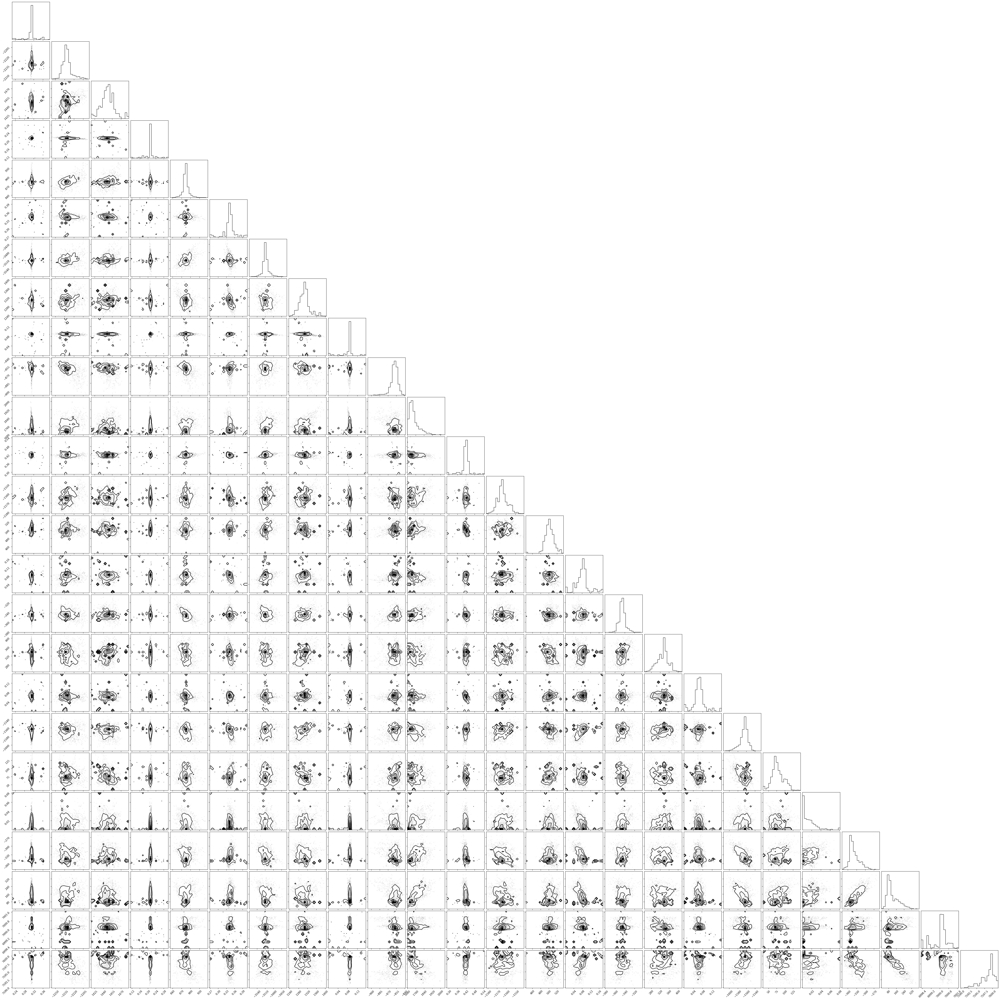

In [19]:
flat_samples = tools.get_flat_samples(all_fit_data[0], labels=None, plot=True)

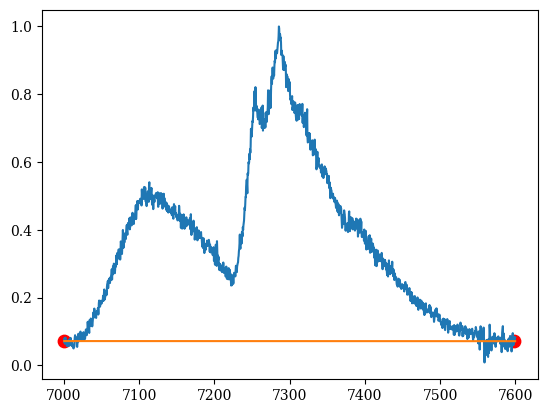

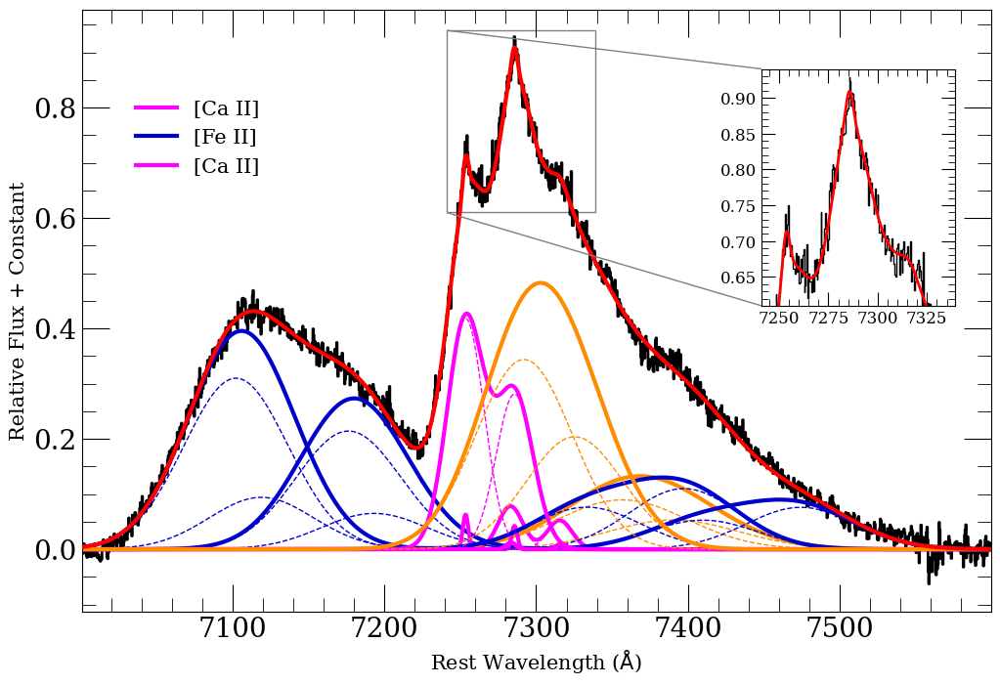

In [20]:
sampler, mgaus_solved, fit_params_solved, fit_lines, fit_params, fit_param_indices, fit_flux_interp, wave_interp, fit_err_interp, fit_cont, scale_factor, fit_hes_matrix = all_fit_data
fit_params_solved_emcee, fit_params_errs_emcee = tools.estimate_params(all_fit_data, flat_samples, burn_in=900)
emcee_samples = tools.get_rand_samples(flat_samples,n=100)
mgaus_solved_emcee = tools.multiple_gaussians(fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, fit_err_interp, fit_cont, fit_param_indices = fit_param_indices, emcee_samples = emcee_samples, plot=True, plot_cont=True, 
                                        plot_ivar=False, plot_resid=False, plot_inset=True, store_line_fluxes = False, savename=None)

In [21]:
for i,param in enumerate(fit_param_indices.keys()):
    print (param + '\t', + np.round(fit_params_solved_emcee[fit_param_indices[param]],2), 
           np.round(fit_params_errs_emcee[fit_param_indices[param]],3))

[Fe II]_a_amp	 0.31 0.002
[Fe II]_a_vel	 -2231.8 7.638
[Fe II]_a_width	 1446.48 9.322
[Fe II]_b_amp	 0.21 0.004
[Fe II]_b_vel	 883.51 8.738
[Fe II]_b_width	 1446.48 9.322
[Ni II]_a_amp	 0.34 0.008
[Ni II]_a_vel	 -3508.68 10.243
[Ni II]_a_width	 1303.21 21.304
[Ni II]_b_amp	 0.09 0.004
[Ni II]_b_vel	 -857.82 5.536
[Ni II]_b_width	 1738.75 49.877
[Ca II]_a_amp	 0.42 0.01
[Ca II]_a_vel	 -1564.64 6.361
[Ca II]_a_width	 502.48 9.407
[Ca II]_b_amp	 0.08 0.02
[Ca II]_b_vel	 -345.59 6.066
[Ca II]_b_width	 331.84 26.972
[Ca II]_c_amp	 0.06 0.013
[Ca II]_c_vel	 -1565.79 9.059
[Ca II]_c_width	 75.9 18.74
[Ca II]_d_amp	 0.01 0.013
[Ca II]_d_vel	 -337.26 19.168
[Ca II]_d_width	 126.55 67.706


In [22]:
SN2023bee_4comp_mostparams_emcee = [fit_lines, fit_flux_interp, wave_interp, fit_params_solved_emcee, 
                                    fit_params_errs_emcee, fit_err_interp, fit_cont, fit_param_indices, 
                                    emcee_samples]
pickle.dump(SN2023bee_4comp_mostparams_emcee, open('emcee_fits/SN2023bee_4component_mostparams_lsfconv.sav', 'wb'))

In [27]:
def gaussian_width(mean, std_dev, amplitude):
    """
    Computes the full width of a Gaussian distribution
    corresponding to where the distribution extends out
    to 10% of its peak, and plots the Gaussian distribution
    and the locations where the distribution is at 10% of the peak.
    
    Parameters:
    mean (float): the mean of the Gaussian distribution
    std_dev (float): the standard deviation of the Gaussian distribution
    amplitude (float): the amplitude (height) of the Gaussian distribution
    
    Returns:
    width (float): the full width at 10% of the peak of the Gaussian distribution
    """
    # Compute the peak of the Gaussian distribution
    peak = amplitude 
    
    # Compute the half-maximum amplitude
    half_max_amplitude = peak * 0.1
    
    # Compute the two points where the Gaussian distribution
    # intersects the half-maximum amplitude
    x1 = mean - std_dev * np.sqrt(-2*np.log(half_max_amplitude))
    x2 = mean + std_dev * np.sqrt(-2*np.log(half_max_amplitude))
    
    # Compute the full width at 10% of the peak of the Gaussian distribution
    width = x2 - x1
    
    # Create an array of x-values
    x = np.linspace(mean - 0*std_dev, mean + 4*std_dev, 1000)
    
    # Compute the Gaussian distribution for each x-value
    y = peak * np.exp(-0.5*((x-mean)/std_dev)**2)
    
    x1 = x[np.argmin(np.absolute(y - half_max_amplitude))]
    print(x1)
    
    # Plot the Gaussian distribution
    plt.plot(x, y)
    
    # Plot the locations where the distribution is at 10% of the peak
    plt.plot([x1], [half_max_amplitude], 'ro')
    # Set the plot limits and labels
#     plt.xlim(mean - 4*std_dev, mean + 4*std_dev)
#     plt.ylim(0, amplitude)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Gaussian distribution')
    # Show the plot
    plt.show()
    
    return x1 - mean

162.8924924924925


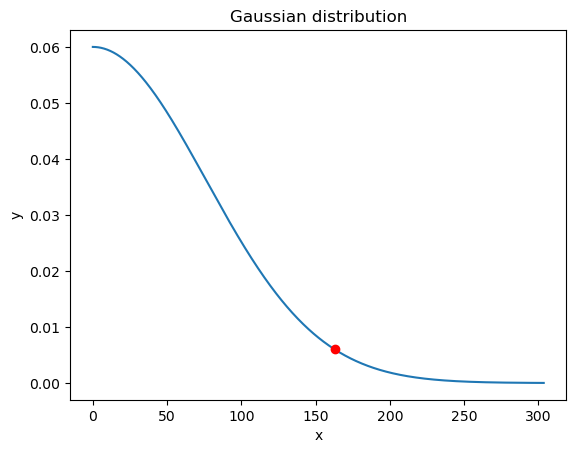

162.8924924924925


In [28]:
print (gaussian_width(0, 75.9, 0.06))

In [7]:
G = 6.67e-11 #m^3 kg-1 s-2
# v = 180*1000 #m s-1
v = 90*1000 #m s-1 HWHM
# v = 160*1000 #m s-1 HW at 10%
r = 10*6.957e8 #m
M = (r*v**2)/(2*G)
M_sun = 1.989e+30 #kg
R_sun = 6.957e8
print (M/M_sun, 'M_sun')

#Mb ranges from .1 to 1.32 Msun
#Mtot = Mej + Mb = 2.1 + 1.32 = 3.42 --> need 1.7+1.7 not possible
#Mtot = Mej + Mb = 2.1 + .3 = 2.5 --> need 1.25+1.25 very unlikely
#Mtot = Mej + Mb = 2.1 + .1 = 2.2 --> need 1.1+1.1 possible

0.2123813658781469 M_sun


In [11]:
print (.47-.21)
print (.21-.05)
M = 0.2*M_sun
print ((2*G)*M*v**(-2.)/R_sun)

0.26
0.15999999999999998
9.417022024180282


In [42]:
vdiff = ((-350)- (-1570))
print (vdiff)
vdiff = vdiff*1000
v = vdiff/2.
print (vdiff, v)

1220
1220000 610000.0


 $\huge P = \frac{\pi d}{v}\newline$
 $\large v = v_{diff}/2 = 610$ km/s $\newline$
 $\huge {P^2} = \frac{4\pi ^2}{G M_{tot}}d^3 \newline$
 $\huge \frac{\pi^2 d^2}{v^2} = \frac{4\pi ^2}{G M_{tot}}d^3$

$\large M_{tot} = 2m_{WD}\newline$
$\huge d = \frac{G M_{tot}}{4 v^2} = \frac{G m_{WD}}{2 v^2}$

In [43]:
d = G*2*M_sun/(4*v**2) #here scale by M_sun
print(d*100, d/R_sun, 'R_sun')

17826699811.878525 0.25624119321372035 R_sun


In [44]:
# print (np.pi*d/v/60, 'min')

$\huge {P}^2 = \frac{2\pi ^2}{G m_{WD}}\frac{P^3 v^3}{\pi ^3} \newline$

$\huge {P} = \frac{\pi G m_{WD}}{2v^3}\newline$

In [45]:
# P = ((2*np.pi*np.pi*d**3)/(G*M))**.5
P = (np.pi*G*M_sun)/(2*v**3) #here scale by M_sun
print (P/60, 'min')

15.301701958127904 min


In [94]:
G = 6.67e-11 #m^3 kg-1 s-2
M_sun = 1.989e+30 #kg
mtot = 2.3*M_sun
P = 5*60
V = 610*1000
a = 5.77e9/100

m1 = V/(G/(mtot*a))**(1./2.)
print (m1/M_sun, mtot/M_sun - m1/M_sun)

0.6101004580860836 1.6898995419139162


In [86]:
print (a,G)
P_orb = 2*np.pi*np.sqrt(a**3/(G*mtot))
print (P_orb/60)

57700000.0 6.67e-11
2.62753258862504


In [5]:
m1 = 1.2*M_sun
m2 = .6*M_sun
r2 = 0.01*6.957e+10 #1% radius of sun
a = (r2/.49)*(0.6 + ((m1/m2)**(2./3.))*np.log(1+(m2/m1)**(1./3.)))
print (a/1e9)

2.168721208485389


$\huge v_{orb} = v_{meas}sec(i)\newline$
$\huge M_{br} = \frac{rv^{2}}{2G}\newline$
$\huge M_{tot} = M_{br}+M_{ej}\newline$
$\huge m_{1} = M_{tot}/2$*assumption$\newline$ 
$\huge v_{orb} = (\frac{Gm_1^{2}}{M_{tot}a})^{1/2}\newline$
$\huge v_{orb} = (\frac{G(\frac{rv^{2}}{4G}+M_{ej}/2)^{2}}{(\frac{rv^{2}}{2G} + M_{ej})a})^{1/2}\newline$

$\huge a = (\frac{G(\frac{rv^{2}}{4G}+M_{ej}/2)^{2}}{(\frac{rv^{2}}{2G} + M_{ej})v_{meas}^{2}sec^{2}(i)})\newline$

In [62]:
G = 6.67e-11 #m^3 kg-1 s-2
M_sun = 1.989e+30 #kg
r = 10*6.957e8 #m
v_meas= 610*1000 #m s-1
v_esc = 90*1000 #m s-1 HWHM
M_ej = 2.1*M_sun
i = np.pi/4
th = np.pi/4
print ((r*v_esc**2)/(2*G)/M_sun)
a = (np.cos(th)*np.cos(th)*np.sin(i)*np.sin(i)*G*((r*v_esc**2)/(4*G) + M_ej/2)**2)/((v_meas**2)*(r*v_esc**2)/(2*G)+M_ej)
print (a/10**9)

0.2123813658781469
0.5610266307750594


In [63]:
# Eggleton83 assuming equal masses
r2 = 0.01*6.957e+10 #1% radius of sun
a = (r2/.49)*(.6)
print (r2/.49/10**9)

1.419795918367347


In [64]:
P = (np.cos(th)*np.cos(th)*np.cos(th)*np.sin(i)*np.sin(i)*np.sin(i)*np.pi*G*(M_ej+(r*v_esc**2)/(4*G))/2)/(2*v_meas**3) #here scale by M_sun
print (P/60, 'min')

2.1099045183207727 min


In [61]:
print (610/np.sin(np.pi/4))

862.670273047588
